#**CODE 1**

#Dataset

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
rtlmhjbn_ip02_dataset_path = kagglehub.dataset_download('rtlmhjbn/ip02-dataset')
print('Data source import complete.')

Data source import complete.


In [ ]:
#Dataset
import numpy as np
import pandas as pd
import os


In [ ]:
print("IP02 Dataset Path:", rtlmhjbn_ip02_dataset_path)

IP02 Dataset Path: /kaggle/input/ip02-dataset


In [ ]:
DATA_PATH = rtlmhjbn_ip02_dataset_path
TRAIN_DIR = os.path.join(DATA_PATH, "classification/train")
VAL_DIR = os.path.join(DATA_PATH, "classification/val")
TEST_DIR = os.path.join(DATA_PATH, "classification/test")

# Get class labels
classes = sorted(os.listdir(TRAIN_DIR))
num_classes = len(classes)
print("Classes:", classes)
print("Number of classes:", num_classes)

Classes: ['0', '1', '10', '100', '101', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '4', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '5', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '6', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '7', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '8', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '9', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99']
Number of classes: 102


#Libraries

In [ ]:
# Importing Libraries
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

import torch
import timm
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader

from torchsummary import summary
import cv2

import torchvision.models as models
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

from tqdm import tqdm
from PIL import Image

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report

#GPU

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


#PEST CLASSIFIER

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import timm

# STN module
class STN(nn.Module):
    def __init__(self):
        super(STN, self).__init__()
        self.localization = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=7),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2),
            nn.Conv2d(8, 10, kernel_size=5),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2)
        )

        with torch.no_grad():
            input = torch.randn(1, 3, 224, 224)
            out = self.localization(input)
            self.flattened_size = out.view(1, -1).size(1)

        self.fc_loc = nn.Sequential(
            nn.Linear(self.flattened_size, 32),
            nn.ReLU(True),
            nn.Linear(32, 6)
        )

        # Initialize as identity transformation
        self.fc_loc[2].weight.data.zero_()
        self.fc_loc[2].bias.data.copy_(torch.tensor([0.8, 0.1, 0, -0.1, 0.8, 0], dtype=torch.float))

    def forward(self, x, return_theta=False):
        xs = self.localization(x)
        xs = xs.view(xs.size(0), -1)
        theta = self.fc_loc(xs).view(-1, 2, 3)

        grid = F.affine_grid(theta, x.size(), align_corners=True)
        x_transformed = F.grid_sample(x, grid, mode='bilinear', padding_mode='border', align_corners=True)

        if return_theta:
            return x_transformed, theta
        return x_transformed


# CBAM remains unchanged
class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=16):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.fc = nn.Sequential(
            nn.Conv2d(in_planes, in_planes // ratio, 1, bias=False),
            nn.ReLU(),
            nn.Conv2d(in_planes // ratio, in_planes, 1, bias=False)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x))
        max_out = self.fc(self.max_pool(x))
        return self.sigmoid(avg_out + max_out)


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        self.conv = nn.Conv2d(2, 1, kernel_size, padding=kernel_size // 2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        return self.sigmoid(self.conv(torch.cat([avg_out, max_out], dim=1)))


class CBAM(nn.Module):
    def __init__(self, in_planes, ratio=16, kernel_size=7):
        super(CBAM, self).__init__()
        self.channel_attention = ChannelAttention(in_planes, ratio)
        self.spatial_attention = SpatialAttention(kernel_size)

    def forward(self, x):
        x = x * self.channel_attention(x)
        x = x * self.spatial_attention(x)
        return x


class PestClassifier(nn.Module):
    def __init__(self, num_classes=102, pretrained_path=None):
        super(PestClassifier, self).__init__()

        self.stn = STN()

        # Load ConvNeXt
        self.backbone = timm.create_model("convnext_large", pretrained=False, features_only=False)

        # Optionally load weights if path is provided
        if pretrained_path is not None:
            state_dict = torch.load(pretrained_path, map_location='cpu')
            self.backbone.load_state_dict(state_dict)

        # Initialize CBAM with correct number of input channels
        self.cbam = CBAM(in_planes=self.backbone.num_features)

        # Replace classification head
        in_features = self.backbone.head.fc.in_features
        self.backbone.head.fc = nn.Linear(in_features, num_classes)

    def forward(self, x, return_theta=False):
        if return_theta:
            x, theta = self.stn(x, return_theta=True)
        else:
            x = self.stn(x)

        features = self.backbone.forward_features(x)
        features = self.cbam(features)
        x_out = self.backbone.forward_head(features, pre_logits=False)

        return (x_out, theta) if return_theta else x_out


'\n\n# Final Model with ConvNeXt Backbone\nclass PestClassifier(nn.Module):\n    def __init__(self, num_classes=102):\n        super(PestClassifier, self).__init__()\n        self.stn = STN()\n        self.backbone = timm.create_model("convnext_large", pretrained=True, features_only=False)\n\n        # ConvNeXt output channels for \'convnext_base\' is 1024\n        #self.cbam = CBAM(in_planes=1024)\n        self.cbam = CBAM(in_planes=self.backbone.num_features)\n\n\n        # Replace classification head\n        in_features = self.backbone.head.fc.in_features  # Get input dim of head\n        self.backbone.head.fc = nn.Linear(in_features, num_classes)\n\n    def forward(self, x, return_theta=False):\n        # 1. Spatial Transformer Network\n        if return_theta:\n            x, theta = self.stn(x, return_theta=True)\n        else:\n            x = self.stn(x)\n\n        # 2. Feature Extraction\n        features = self.backbone.forward_features(x)  # [B, C, H, W]\n\n        # 3. CBA

#TRANSFORMATIONS

In [ ]:
# 3. Data Transformations

# Data Transformations
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets
train_dataset = datasets.ImageFolder(TRAIN_DIR, transform=data_transforms)
val_dataset = datasets.ImageFolder(VAL_DIR, transform=data_transforms)
test_dataset = datasets.ImageFolder(TEST_DIR, transform=data_transforms)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

#MODEL INITIALIZATION

In [ ]:
# 4. Model Initialization
model = PestClassifier(
    num_classes=102,
    pretrained_path="/kaggle/input/convnext_large/pytorch/default/1/convnext_large.pth"
).to(device)

summary(model, (3, 224, 224))

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4) # L2 Regularizations

<ipython-input-7-53f1c0474e16>:102: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(pretrained_path, map_location='cpu')


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 218, 218]           1,184
              ReLU-2          [-1, 8, 218, 218]               0
         MaxPool2d-3          [-1, 8, 109, 109]               0
            Conv2d-4         [-1, 10, 105, 105]           2,010
              ReLU-5         [-1, 10, 105, 105]               0
         MaxPool2d-6           [-1, 10, 52, 52]               0
            Linear-7                   [-1, 32]         865,312
              ReLU-8                   [-1, 32]               0
            Linear-9                    [-1, 6]             198
              STN-10          [-1, 3, 224, 224]               0
           Conv2d-11          [-1, 192, 56, 56]           9,408
      LayerNorm2d-12          [-1, 192, 56, 56]             384
         Identity-13          [-1, 192, 56, 56]               0
           Conv2d-14          [-1, 192,

#TRAINING AND EVALUATION

In [ ]:
# 5. Training and Evaluation Functions
def evaluate_model(model, val_loader):
    model.eval()
    correct, total, running_loss = 0, 0, 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

    return 100. * correct / total, running_loss / len(val_loader)

def train_model(model, train_loader, val_loader, epochs=10, patience=3):
    train_losses, val_losses, train_accs, val_accs = [], [], [], []
    best_val_acc = 0.0
    patience_counter = 0
    best_model_weights = None

    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for batch_idx, (images, labels) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

            print(f"Epoch [{epoch+1}/{epochs}], Batch [{batch_idx+1}/{len(train_loader)}] - Loss: {loss.item():.4f}")

        train_acc = 100. * correct / total
        val_acc, val_loss = evaluate_model(model, val_loader)

        train_losses.append(running_loss / len(train_loader))
        val_losses.append(val_loss)
        train_accs.append(train_acc)
        val_accs.append(val_acc)

        print(f"Epoch [{epoch+1}/{epochs}] => Train Loss: {running_loss / len(train_loader):.4f}, Train Acc: {train_acc:.2f}%, Val Acc: {val_acc:.2f}%")

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_weights = model.state_dict().copy()
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"Early Stopping Patience: {patience_counter}/{patience}")
            if patience_counter >= patience:
                print("Early stopping triggered. Restoring best model weights.")
                model.load_state_dict(best_model_weights)
                break

        visualize_stn(model, train_loader, device)


    model.load_state_dict(best_model_weights)
    torch.save(best_model_weights, "pest_classifier_best.pth")
    print("Best model saved successfully!")
    return train_accs, val_accs, train_losses, val_losses


#Visualization Functions

In [ ]:
# 6. Visualization Functions
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2

def visualize_stn(model, train_loader, device):
    model.eval()
    with torch.no_grad():

        data_iter = iter(train_loader)
        images, _ = next(data_iter)
        images = images[:5].to(device)


        image_tensor = images

        transformed_images, theta = model.stn(image_tensor, return_theta=True)
        transformed_images = transformed_images.cpu().numpy()
        theta = theta.cpu().numpy()


        images = images.cpu().numpy()
        images = np.transpose(images, (0, 2, 3, 1))
        transformed_images = np.transpose(transformed_images, (0, 2, 3, 1))


        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        images = (images * std) + mean
        transformed_images = (transformed_images * std) + mean

        fig, axes = plt.subplots(3, 5, figsize=(20, 22))

        for i in range(5):

            original_img = (images[i] * 255).clip(0, 255).astype(np.uint8)
            transformed_img = (transformed_images[i] * 255).clip(0, 255).astype(np.uint8)
            original_img = cv2.cvtColor(original_img, cv2.COLOR_RGB2BGR)
            transformed_img = cv2.cvtColor(transformed_img, cv2.COLOR_RGB2BGR)

            h, w, _ = original_img.shape
            box = np.array([[0, 0], [w - 1, 0], [w - 1, h - 1], [0, h - 1]], dtype=np.float32)


            theta_i = theta[i]


            ones = np.ones((4, 1))
            box_homogeneous = np.hstack([box, ones])
            transformed_box = np.dot(theta_i, box_homogeneous.T).T

            # bounding boxes
            for j in range(4):
                p1 = tuple(box[j].astype(int))
                p2 = tuple(box[(j + 1) % 4].astype(int))
                cv2.line(original_img, p1, p2, (255, 0, 0), 2)

                p1_t = tuple(transformed_box[j].astype(int))
                p2_t = tuple(transformed_box[(j + 1) % 4].astype(int))
                cv2.line(transformed_img, p1_t, p2_t, (0, 255, 0), 2)

            src_pts = transformed_box.astype(np.float32)
            dst_pts = np.array([[0, 0], [w - 1, 0], [w - 1, h - 1], [0, h - 1]], dtype=np.float32)
            M = cv2.getPerspectiveTransform(src_pts, dst_pts)
            cropped_img = cv2.warpPerspective(transformed_img, M, (w, h))

            # Display images
            axes[0, i].imshow(original_img)
            axes[0, i].set_title("Original")
            axes[0, i].axis("off")

            axes[1, i].imshow(transformed_img)
            axes[1, i].set_title("Transformed (With ROI)")
            axes[1, i].axis("off")

            axes[2, i].imshow(cropped_img)
            axes[2, i].set_title("Final Transformed")
            axes[2, i].axis("off")

        plt.suptitle("STN Transformation Visualization with Cropped ROI")
        plt.show()
def plot_graphs(train_accs, val_accs, test_accs, train_losses, val_losses, test_losses):
    epochs = range(1, len(train_accs) + 1)
    plt.figure(figsize=(12, 5))


    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_accs, 'bo-', label='Train Accuracy')
    plt.plot(epochs, val_accs, 'ro-', label='Val Accuracy')
    plt.plot(epochs, test_accs, 'go-', label='Test Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Train, Validation & Test Accuracy')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_losses, 'bo-', label='Train Loss')
    plt.plot(epochs, val_losses, 'ro-', label='Val Loss')
    plt.plot(epochs, test_losses, 'go-', label='Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Train, Validation & Test Loss')
    plt.legend()

    plt.show()


#Test


In [ ]:
def test_model(model, test_loader, verbose=True):
    model.eval()
    correct, total, running_loss = 0, 0, 0.0
    y_true, y_pred = [], []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item()

            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())

    test_acc = 100. * correct / total
    test_loss = running_loss / len(test_loader)

    print(f"Test Accuracy: {test_acc:.2f}%, Test Loss: {test_loss:.4f}")

    # Confusion Matrix & Classification Report
    cm = confusion_matrix(y_true, y_pred)
    print("Classification Report:\n", classification_report(y_true, y_pred))

    plt.figure(figsize=(20, 22))
    sns.heatmap(cm, annot=True, fmt="d", cmap="viridis")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()

    return test_acc, test_loss

Epoch [1/10], Batch [1/1410] - Loss: 4.7443
Epoch [1/10], Batch [2/1410] - Loss: 4.6746
Epoch [1/10], Batch [3/1410] - Loss: 4.4942
Epoch [1/10], Batch [4/1410] - Loss: 4.5136
Epoch [1/10], Batch [5/1410] - Loss: 4.3865
Epoch [1/10], Batch [6/1410] - Loss: 4.3344
Epoch [1/10], Batch [7/1410] - Loss: 4.0729
Epoch [1/10], Batch [8/1410] - Loss: 3.8090
Epoch [1/10], Batch [9/1410] - Loss: 4.1552
Epoch [1/10], Batch [10/1410] - Loss: 3.8021
Epoch [1/10], Batch [11/1410] - Loss: 3.8740
Epoch [1/10], Batch [12/1410] - Loss: 3.7131
Epoch [1/10], Batch [13/1410] - Loss: 3.8666
Epoch [1/10], Batch [14/1410] - Loss: 4.1317
Epoch [1/10], Batch [15/1410] - Loss: 3.3477
Epoch [1/10], Batch [16/1410] - Loss: 3.5483
Epoch [1/10], Batch [17/1410] - Loss: 3.7226
Epoch [1/10], Batch [18/1410] - Loss: 3.5025
Epoch [1/10], Batch [19/1410] - Loss: 3.9197
Epoch [1/10], Batch [20/1410] - Loss: 3.6304
Epoch [1/10], Batch [21/1410] - Loss: 3.6677
Epoch [1/10], Batch [22/1410] - Loss: 3.5247
Epoch [1/10], Batch

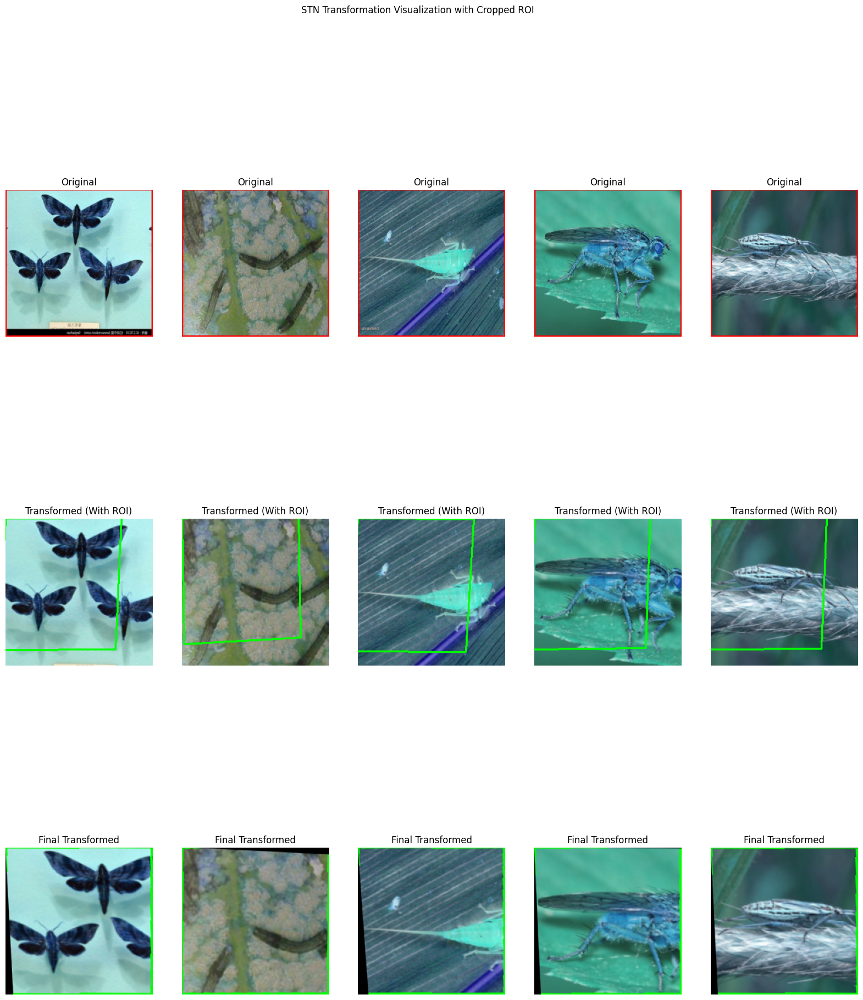

Epoch [2/10], Batch [1/1410] - Loss: 0.8497
Epoch [2/10], Batch [2/1410] - Loss: 0.4437
Epoch [2/10], Batch [3/1410] - Loss: 0.6454
Epoch [2/10], Batch [4/1410] - Loss: 0.5247
Epoch [2/10], Batch [5/1410] - Loss: 0.7754
Epoch [2/10], Batch [6/1410] - Loss: 0.7008
Epoch [2/10], Batch [7/1410] - Loss: 0.7384
Epoch [2/10], Batch [8/1410] - Loss: 0.7603
Epoch [2/10], Batch [9/1410] - Loss: 0.8615
Epoch [2/10], Batch [10/1410] - Loss: 0.6289
Epoch [2/10], Batch [11/1410] - Loss: 0.7856
Epoch [2/10], Batch [12/1410] - Loss: 0.9288
Epoch [2/10], Batch [13/1410] - Loss: 0.7197
Epoch [2/10], Batch [14/1410] - Loss: 1.2868
Epoch [2/10], Batch [15/1410] - Loss: 0.3228
Epoch [2/10], Batch [16/1410] - Loss: 1.0296
Epoch [2/10], Batch [17/1410] - Loss: 0.3744
Epoch [2/10], Batch [18/1410] - Loss: 0.4228
Epoch [2/10], Batch [19/1410] - Loss: 0.6918
Epoch [2/10], Batch [20/1410] - Loss: 0.6333
Epoch [2/10], Batch [21/1410] - Loss: 0.5076
Epoch [2/10], Batch [22/1410] - Loss: 0.5848
Epoch [2/10], Batch

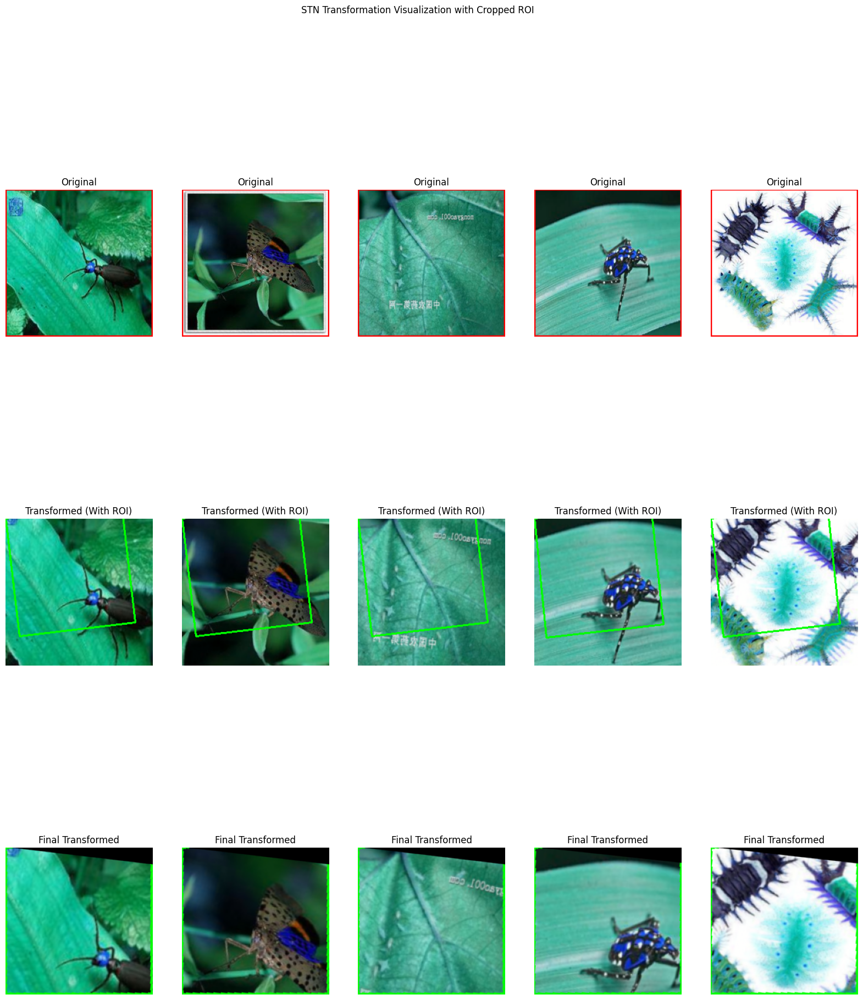

Epoch [3/10], Batch [1/1410] - Loss: 0.2531
Epoch [3/10], Batch [2/1410] - Loss: 0.6558
Epoch [3/10], Batch [3/1410] - Loss: 0.4374
Epoch [3/10], Batch [4/1410] - Loss: 0.2782
Epoch [3/10], Batch [5/1410] - Loss: 0.2847
Epoch [3/10], Batch [6/1410] - Loss: 0.2312
Epoch [3/10], Batch [7/1410] - Loss: 0.5712
Epoch [3/10], Batch [8/1410] - Loss: 0.3470
Epoch [3/10], Batch [9/1410] - Loss: 0.4220
Epoch [3/10], Batch [10/1410] - Loss: 0.4014
Epoch [3/10], Batch [11/1410] - Loss: 0.9343
Epoch [3/10], Batch [12/1410] - Loss: 0.2791
Epoch [3/10], Batch [13/1410] - Loss: 0.6329
Epoch [3/10], Batch [14/1410] - Loss: 0.5369
Epoch [3/10], Batch [15/1410] - Loss: 0.3931
Epoch [3/10], Batch [16/1410] - Loss: 0.3785
Epoch [3/10], Batch [17/1410] - Loss: 0.1407
Epoch [3/10], Batch [18/1410] - Loss: 0.3729
Epoch [3/10], Batch [19/1410] - Loss: 0.2729
Epoch [3/10], Batch [20/1410] - Loss: 0.3859
Epoch [3/10], Batch [21/1410] - Loss: 0.2293
Epoch [3/10], Batch [22/1410] - Loss: 0.2460
Epoch [3/10], Batch

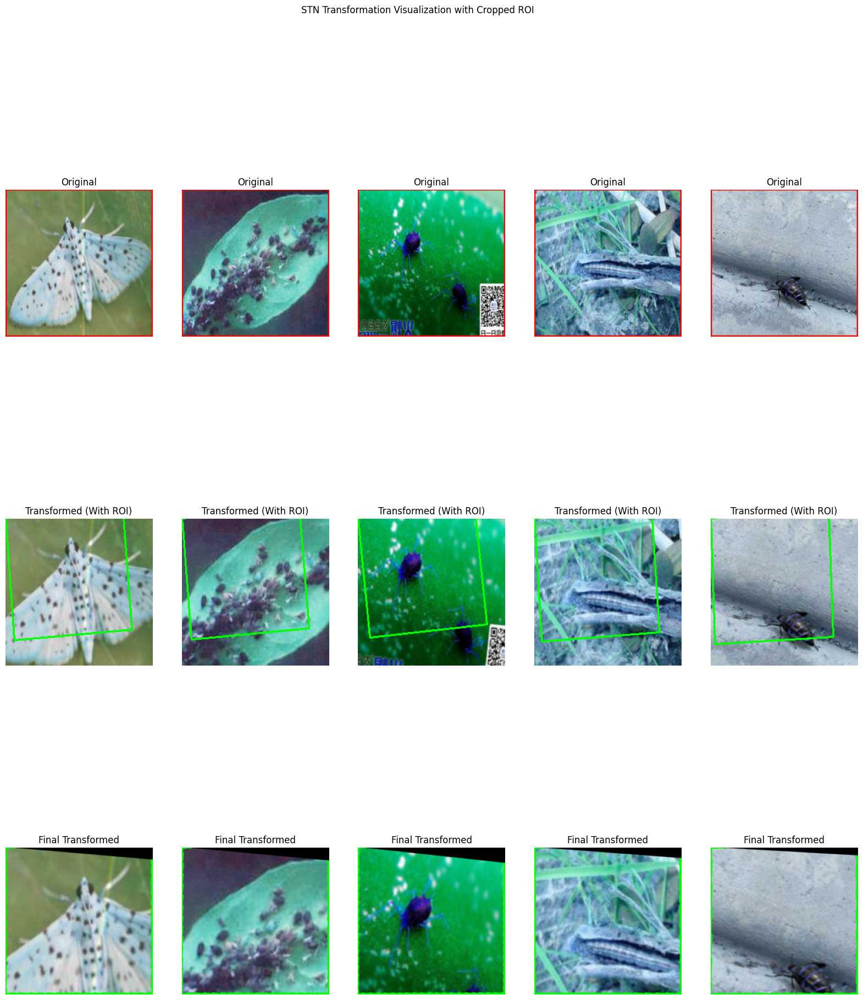

Epoch [4/10], Batch [1/1410] - Loss: 0.1881
Epoch [4/10], Batch [2/1410] - Loss: 0.0444
Epoch [4/10], Batch [3/1410] - Loss: 0.1594
Epoch [4/10], Batch [4/1410] - Loss: 0.2866
Epoch [4/10], Batch [5/1410] - Loss: 0.2130
Epoch [4/10], Batch [6/1410] - Loss: 0.1312
Epoch [4/10], Batch [7/1410] - Loss: 0.1450
Epoch [4/10], Batch [8/1410] - Loss: 0.1504
Epoch [4/10], Batch [9/1410] - Loss: 0.1559
Epoch [4/10], Batch [10/1410] - Loss: 0.2721
Epoch [4/10], Batch [11/1410] - Loss: 0.1191
Epoch [4/10], Batch [12/1410] - Loss: 0.0746
Epoch [4/10], Batch [13/1410] - Loss: 0.1115
Epoch [4/10], Batch [14/1410] - Loss: 0.1785
Epoch [4/10], Batch [15/1410] - Loss: 0.1721
Epoch [4/10], Batch [16/1410] - Loss: 0.2020
Epoch [4/10], Batch [17/1410] - Loss: 0.0726
Epoch [4/10], Batch [18/1410] - Loss: 0.2773
Epoch [4/10], Batch [19/1410] - Loss: 0.1326
Epoch [4/10], Batch [20/1410] - Loss: 0.1937
Epoch [4/10], Batch [21/1410] - Loss: 0.2644
Epoch [4/10], Batch [22/1410] - Loss: 0.4804
Epoch [4/10], Batch

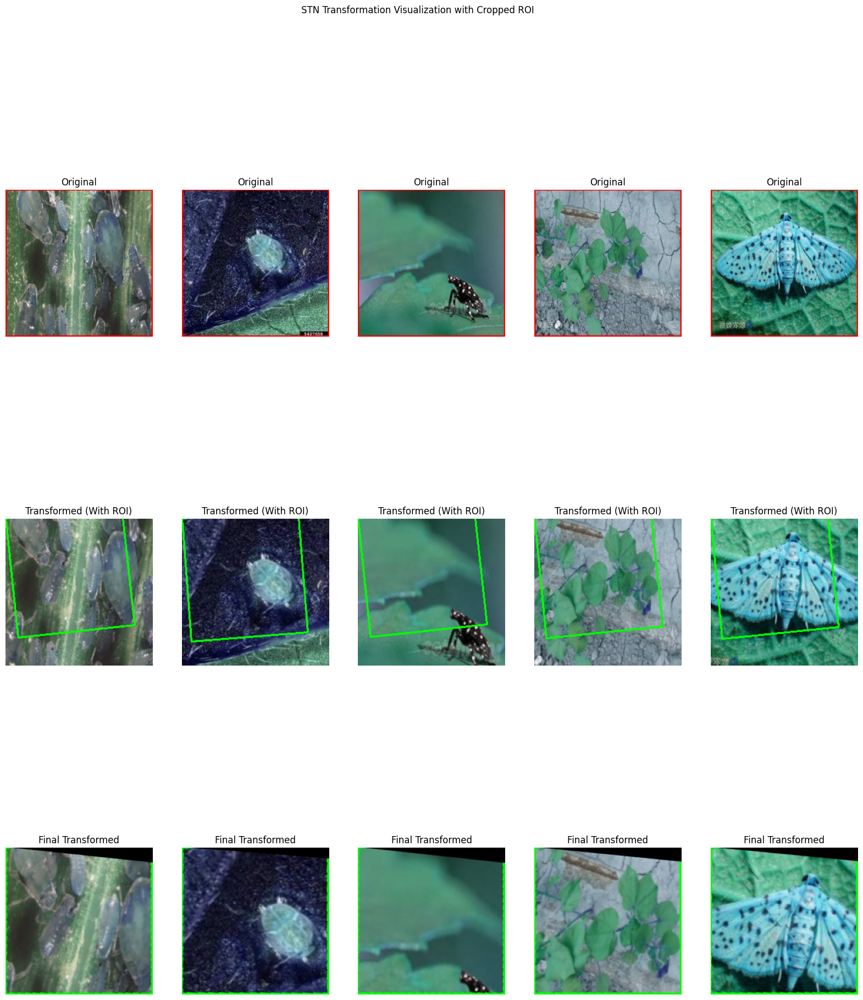

Epoch [5/10], Batch [1/1410] - Loss: 0.1957
Epoch [5/10], Batch [2/1410] - Loss: 0.2390
Epoch [5/10], Batch [3/1410] - Loss: 0.0998
Epoch [5/10], Batch [4/1410] - Loss: 0.0834
Epoch [5/10], Batch [5/1410] - Loss: 0.0481
Epoch [5/10], Batch [6/1410] - Loss: 0.1114
Epoch [5/10], Batch [7/1410] - Loss: 0.0962
Epoch [5/10], Batch [8/1410] - Loss: 0.0328
Epoch [5/10], Batch [9/1410] - Loss: 0.2254
Epoch [5/10], Batch [10/1410] - Loss: 0.2295
Epoch [5/10], Batch [11/1410] - Loss: 0.1172
Epoch [5/10], Batch [12/1410] - Loss: 0.1622
Epoch [5/10], Batch [13/1410] - Loss: 0.2034
Epoch [5/10], Batch [14/1410] - Loss: 0.2805
Epoch [5/10], Batch [15/1410] - Loss: 0.1158
Epoch [5/10], Batch [16/1410] - Loss: 0.0322
Epoch [5/10], Batch [17/1410] - Loss: 0.0854
Epoch [5/10], Batch [18/1410] - Loss: 0.2937
Epoch [5/10], Batch [19/1410] - Loss: 0.0592
Epoch [5/10], Batch [20/1410] - Loss: 0.2150
Epoch [5/10], Batch [21/1410] - Loss: 0.1045
Epoch [5/10], Batch [22/1410] - Loss: 0.2112
Epoch [5/10], Batch

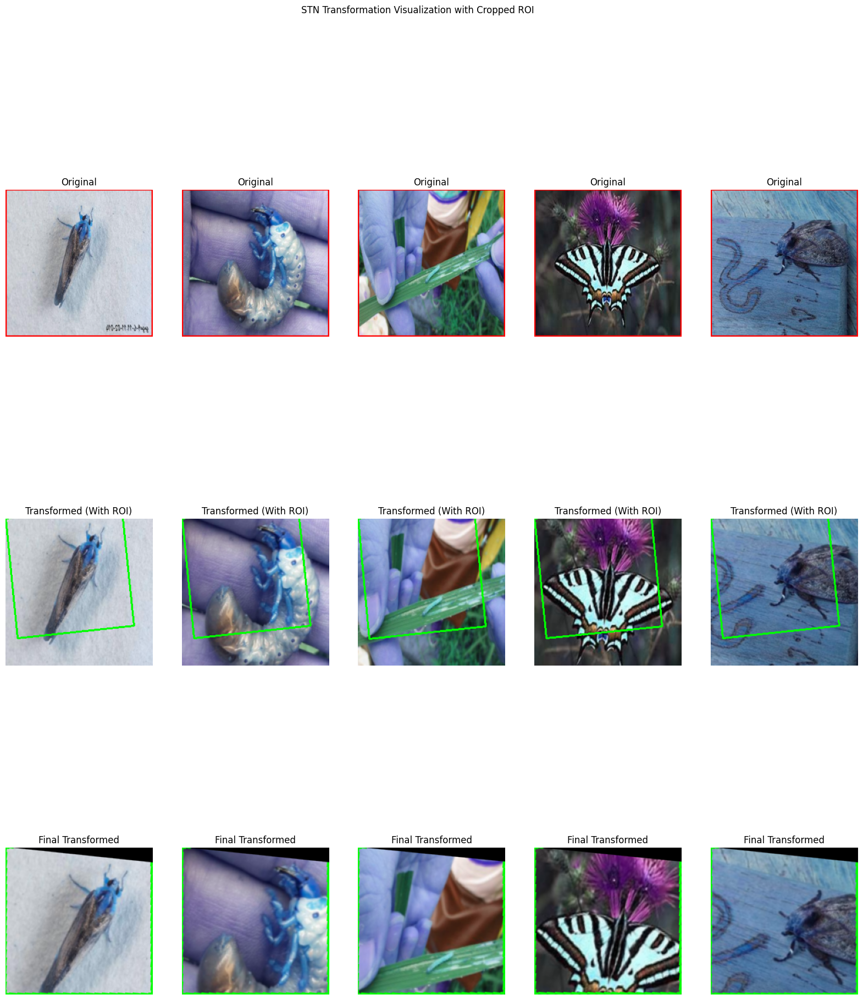

Epoch [6/10], Batch [1/1410] - Loss: 0.0272
Epoch [6/10], Batch [2/1410] - Loss: 0.0690
Epoch [6/10], Batch [3/1410] - Loss: 0.1259
Epoch [6/10], Batch [4/1410] - Loss: 0.0492
Epoch [6/10], Batch [5/1410] - Loss: 0.2353
Epoch [6/10], Batch [6/1410] - Loss: 0.0980
Epoch [6/10], Batch [7/1410] - Loss: 0.1536
Epoch [6/10], Batch [8/1410] - Loss: 0.1111
Epoch [6/10], Batch [9/1410] - Loss: 0.1131
Epoch [6/10], Batch [10/1410] - Loss: 0.0472
Epoch [6/10], Batch [11/1410] - Loss: 0.1023
Epoch [6/10], Batch [12/1410] - Loss: 0.3130
Epoch [6/10], Batch [13/1410] - Loss: 0.0988
Epoch [6/10], Batch [14/1410] - Loss: 0.1443
Epoch [6/10], Batch [15/1410] - Loss: 0.0807
Epoch [6/10], Batch [16/1410] - Loss: 0.1051
Epoch [6/10], Batch [17/1410] - Loss: 0.1393
Epoch [6/10], Batch [18/1410] - Loss: 0.1633
Epoch [6/10], Batch [19/1410] - Loss: 0.2002
Epoch [6/10], Batch [20/1410] - Loss: 0.0499
Epoch [6/10], Batch [21/1410] - Loss: 0.3203
Epoch [6/10], Batch [22/1410] - Loss: 0.0741
Epoch [6/10], Batch

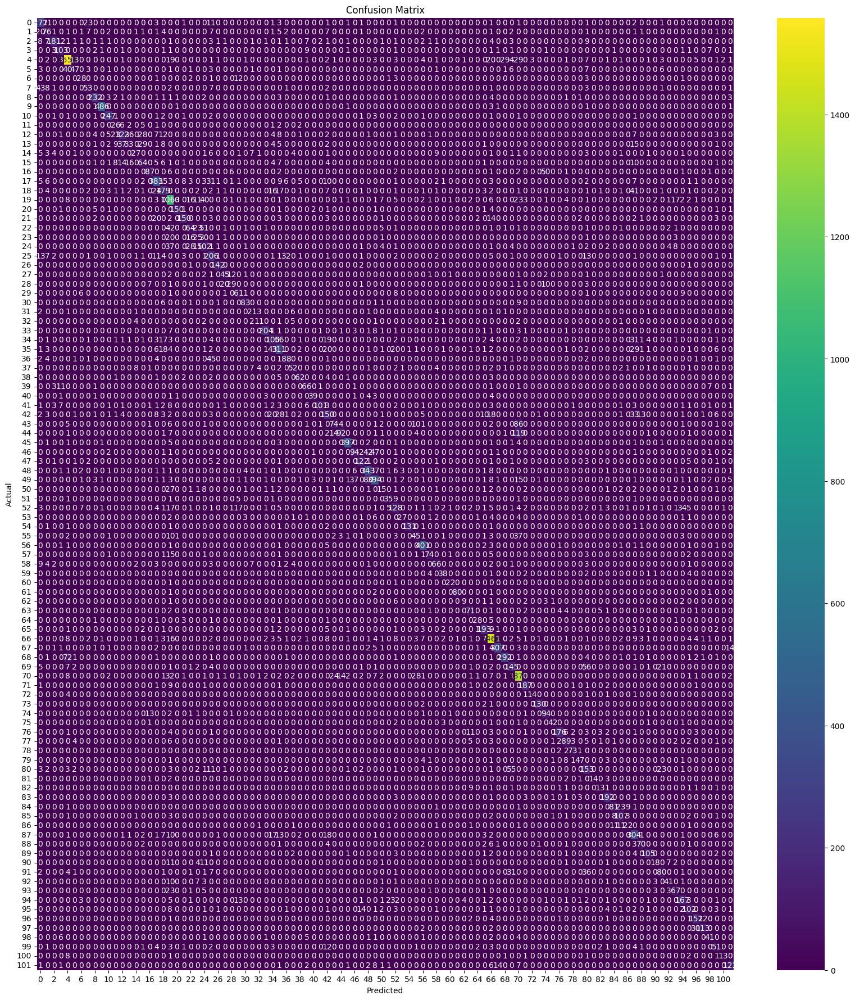

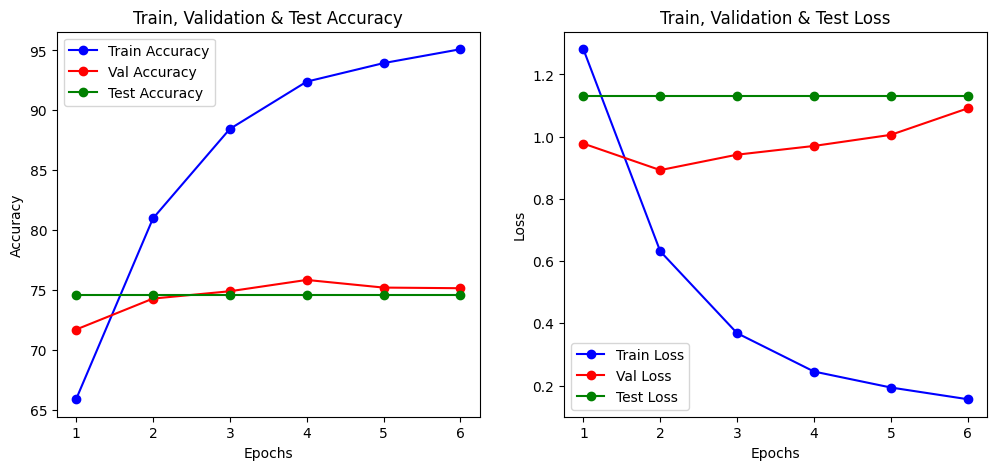

In [ ]:
# Train and Evaluate
train_accs, val_accs, train_losses, val_losses = train_model(model, train_loader, val_loader, epochs=10, patience=2)
test_acc, test_loss = test_model(model, test_loader)
plot_graphs(train_accs, val_accs, [test_acc] * len(train_accs), train_losses, val_losses, [test_loss] * len(train_accs))

#PREDICTION

In [ ]:
def predict_image(model, image_path, class_names):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        _, predicted = torch.max(output, 1)

    predicted_class = class_names[predicted.item()]

    plt.imshow(image)
    plt.title(f"Predicted Class: {predicted_class}")
    plt.axis("off")
    plt.show()

    print(f"Predicted Class: {predicted_class}")


In [ ]:
# During the training (or saving) phase:
torch.save(model.state_dict(), "/content/pest_classifier_best.pth")
# During the loading phase:
model = PestClassifier(num_classes=102).to(device)
model.load_state_dict(torch.load("/content/pest_classifier_best.pth"))

In [ ]:
# Example Usage for Predicting a Random Image
image_path = "/content/test.jpg"
predict_image(model, image_path, classes)

#GRAD CAM RESULTS

In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_layers()

    def hook_layers(self):
        def forward_hook(module, input, output):
            self.activations = output

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0]

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate_cam(self, class_idx):
        grads = self.gradients
        activations = self.activations

        pooled_grads = torch.mean(grads, dim=[0, 2, 3])
        cam = torch.zeros(activations.shape[2:], dtype=torch.float32)

        for i in range(pooled_grads.shape[0]):
            cam += pooled_grads[i] * activations[0, i, :, :]

        cam = torch.clamp(cam, min=0)
        cam -= cam.min()
        cam /= cam.max()
        return cam.cpu().detach().numpy()


In [ ]:
def apply_gradcam(model, image_path, target_class=None):
    model.eval()

    # Preprocess image
    image = Image.open(image_path).convert("RGB")  # Ensure RGB format
    img = np.array(image.resize((224, 224)))  # Resize and convert to NumPy array

    tensor_image = data_transforms(image).unsqueeze(0)

    # Hook into the model
    target_layer = model.convnext.features[-1]  # Last convolutional layer
    gradcam = GradCAM(model, target_layer)

    tensor_image.requires_grad_()
    coarse_pred, fine_pred = model(tensor_image)

    # Choose the class index
    class_idx = target_class if target_class is not None else fine_pred.argmax().item()

    # Compute gradients
    model.zero_grad()
    fine_pred[:, class_idx].backward()

    # Generate Grad-CAM heatmap
    cam = gradcam.generate_cam(class_idx)

    # Resize heatmap to match the image size (224x224)
    heatmap = cv2.resize(cam, (224, 224))
    heatmap = np.uint8(255 * heatmap)  # Convert to uint8 format
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Ensure heatmap has 3 channels (sometimes OpenCV returns single-channel output)
    if heatmap.shape[-1] != 3:
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_GRAY2RGB)

    # Ensure `img` is in the correct format
    if img.shape[-1] != 3:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    # Superimpose heatmap onto image
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # Display image with heatmap
    plt.figure(figsize=(6, 6))
    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()


In [ ]:
apply_gradcam(model, image_path)